# Stellar Classfication

# 1. Loading the Data

In [64]:
#importing libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
import joblib

from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import classification_report

warnings.filterwarnings('ignore')
%matplotlib inline

#loading the data
df=pd.read_csv('../input/stellar-classification-dataset-sdss17/star_classification.csv')
df.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [65]:
!pip install autoviz

# 2. Exploratory Data Analysis

In [66]:
#getting the stastical information
df.describe().T

,count,mean,std,min,25%,50%,75%,max
obj_ID,100000.0,1.237665e+18,8.438560e+12,1.237646e+18,1.237659e+18,1.237663e+18,1.237668e+18,1.237681e+18
alpha,100000.0,1.776291e+02,9.650224e+01,5.527828e-03,1.275182e+02,1.809007e+02,2.338950e+02,3.599998e+02
delta,100000.0,2.413530e+01,1.964467e+01,-1.878533e+01,5.146771e+00,2.364592e+01,3.990155e+01,8.300052e+01
u,100000.0,2.198047e+01,3.176929e+01,-9.999000e+03,2.035235e+01,2.217914e+01,2.368744e+01,3.278139e+01
g,100000.0,2.053139e+01,3.175029e+01,-9.999000e+03,1.896523e+01,2.109983e+01,2.212377e+01,3.160224e+01
r,100000.0,1.964576e+01,1.854760e+00,9.822070e+00,1.813583e+01,2.012529e+01,2.104478e+01,2.957186e+01
i,100000.0,1.908485e+01,1.757895e+00,9.469903e+00,1.773228e+01,1.940514e+01,2.039650e+01,3.214147e+01
z,100000.0,1.866881e+01,3.172815e+01,-9.999000e+03,1.746068e+01,1.900460e+01,1.992112e+01,2.938374e+01
run_ID,100000.0,4.481366e+03,1.964765e+03,1.090000e+02,3.187000e+03,4.188000e+03,5.326000e+03,8.162000e+03
rerun_ID,100000.0,3.010000e+02,0.000000e+00,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02,3.010000e+02


In [67]:
#counting the frequency of each element from the 'class'
df['class'].value_counts()

GALAXY    59445
STAR      21594
QSO       18961
Name: class, dtype: int64

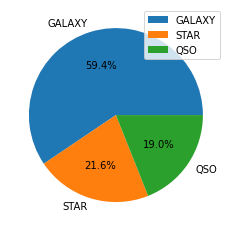

In [68]:
#proportion of different elements of the class
plt.pie(df['class'].value_counts(),autopct="%1.1f%%",labels=['GALAXY','STAR','QSO'])
plt.legend()

<AxesSubplot:>

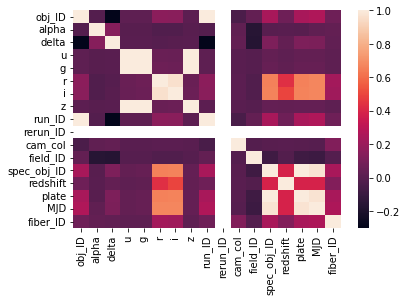

In [69]:
#correlation between the columns
sns.heatmap(df.corr())

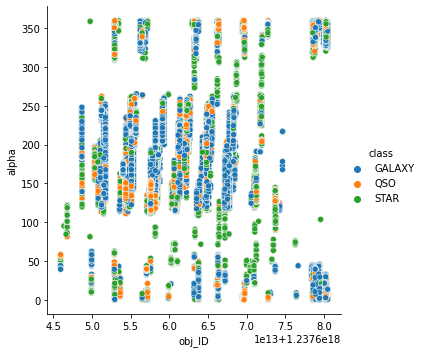

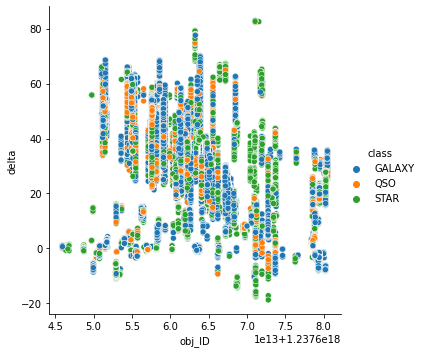

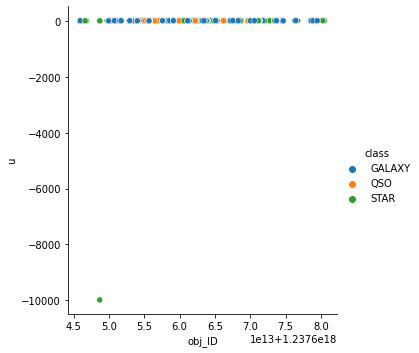

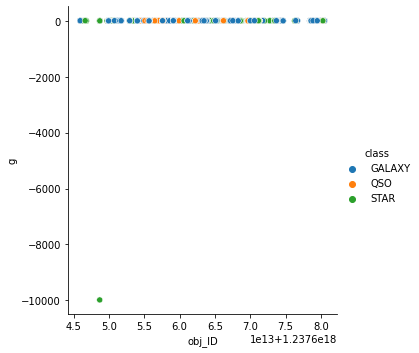

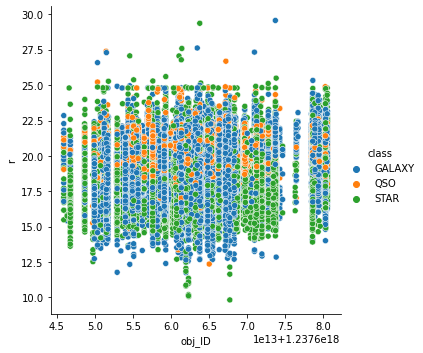

...

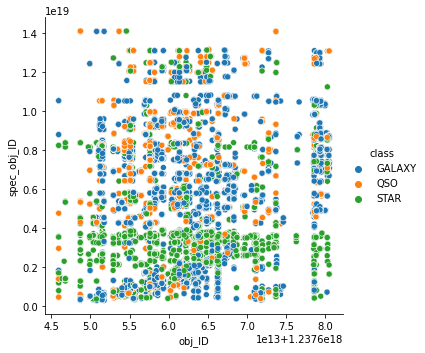

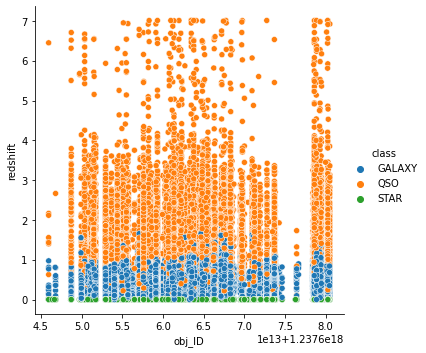

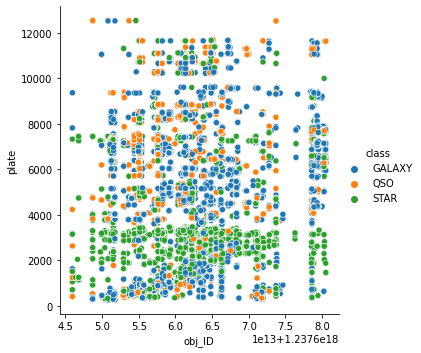

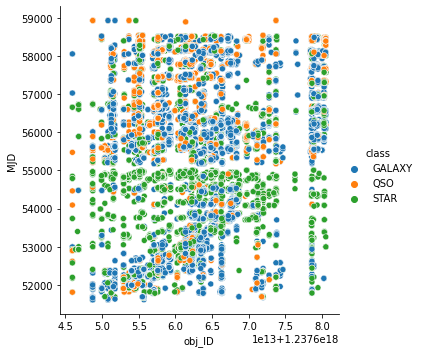

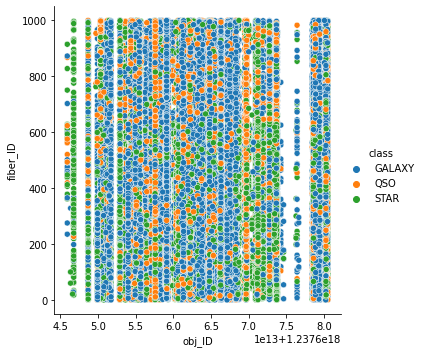

In [70]:
#comparing variations of different attributes with 'obj_ID'
plots=[]
for i in ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'redshift',
       'plate', 'MJD', 'fiber_ID']:
    g=sns.relplot(data=df, x='obj_ID', y=i, hue='class')
    plots.append(g);

Here it seems that the `redshift` plays an important part in the stellar classification since we can clearly distinguish between the various clusters of points. Attributes which are showing y=mx+c relationship with `obj_ID` are insiginificant and need to removed. Which include cam_col, run_ID and rerun_ID (we won't use this while fitting the model). It may seem that the relation of `u`, `g` and `z` is also of the simliar sorts but if you observed closely there is an outlier, which causes all the other data points to appear linear.

# 3. Feature Engineering

In [71]:
#Filtering the data
#Removing the outliers
print('Shape before filtering :',df.shape)
df=df[df.z>-2000]
df=df[df.u>-2000]
df=df[df.g>-2000]
print('Shape after filtering :',df.shape)
#There was only one value going off the limits 
#so we haven't loss signinficant amount of the data

Shape before filtering : (100000, 18)
Shape after filtering : (99999, 18)


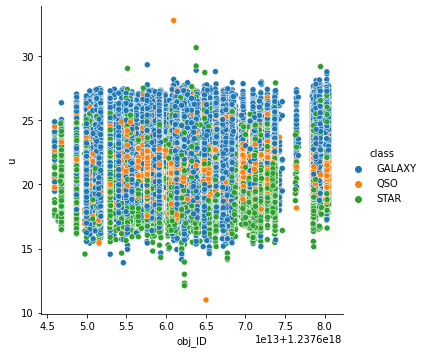

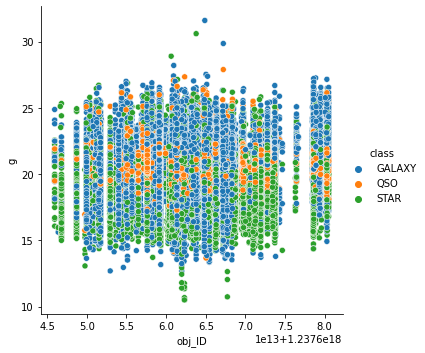

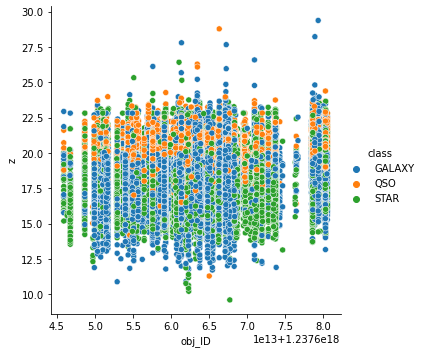

In [72]:
for i in ['u', 'g', 'z']:
    sns.relplot(data=df, x='obj_ID', y=i, hue='class')

In [73]:
df.keys()

Index(['obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object')

In [74]:
#dropping the unnecessary columns
df.drop(['obj_ID','cam_col', 'run_ID', 'rerun_ID'] ,axis=1, inplace=True)
df.shape

(99999, 14)

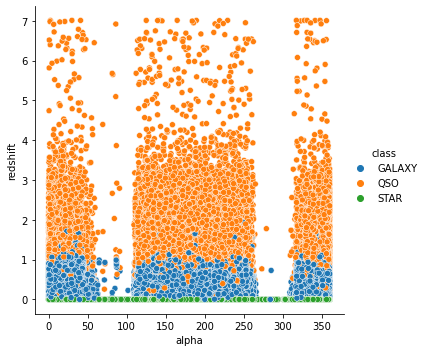

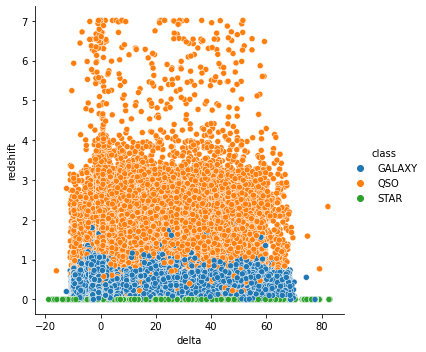

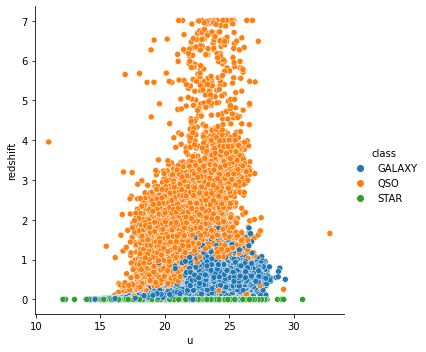

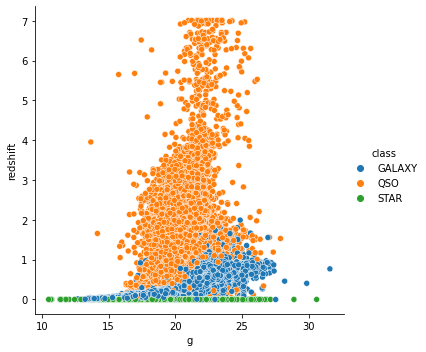

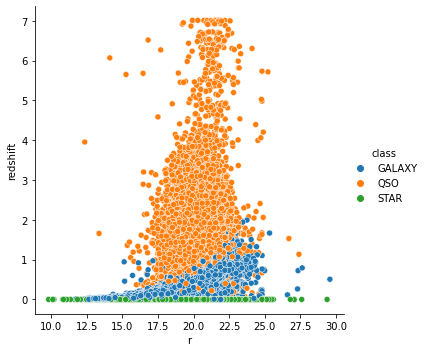

...

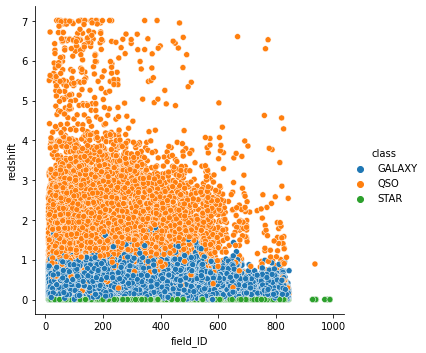

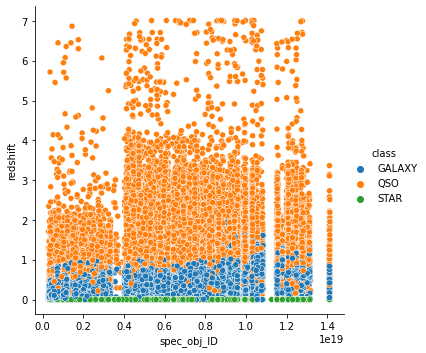

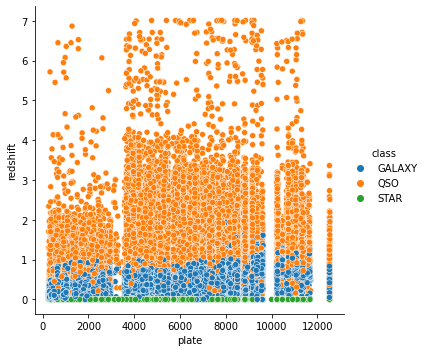

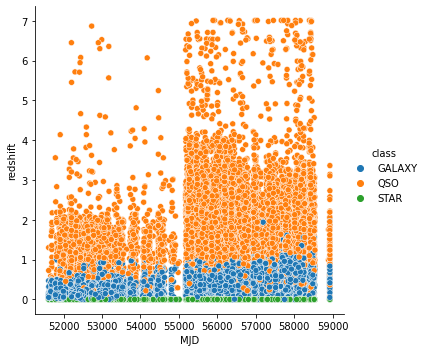

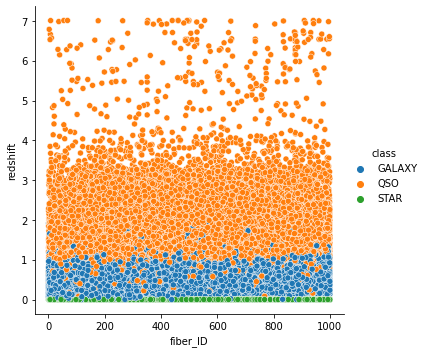

In [75]:
#since the 'redshift' is the most significant while classifying the data
#we will see the variations in other attributes with 'redshift'
plots=[]
for i in ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'field_ID', 'spec_obj_ID',
          'plate', 'MJD', 'fiber_ID']:
    g=sns.relplot(data=df, x=i, y='redshift', hue='class')
    plots.append(g)
#these plots show distribution of data points wrt to the redshift, and helps us identify the irrelevent attributes

In [76]:
!pip install dabl

Target looks like classification
Linear Discriminant Analysis training set score: 0.799


[[<Figure size 1440x648 with 15 Axes>,
  <Figure size 1152x288 with 4 Axes>,
  <Figure size 1152x288 with 4 Axes>,
  <Figure size 288x288 with 1 Axes>],
 None]

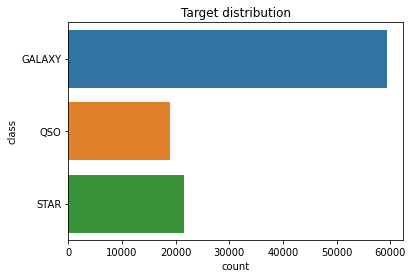

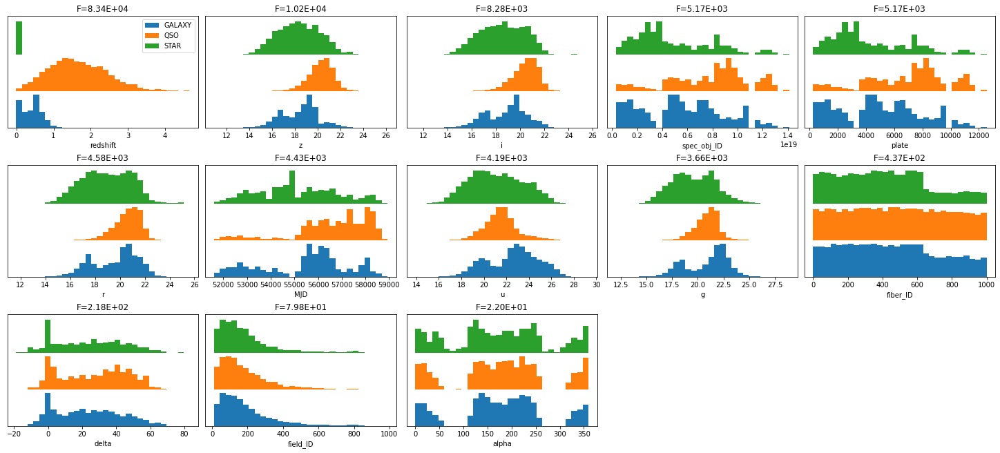

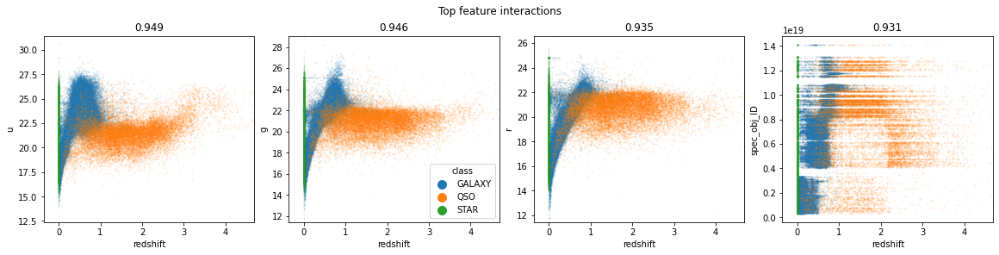

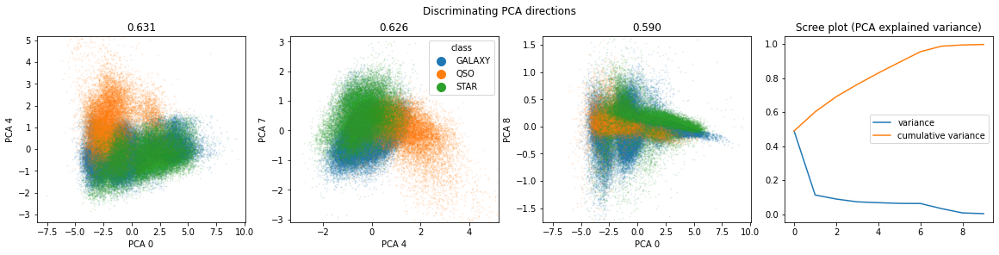

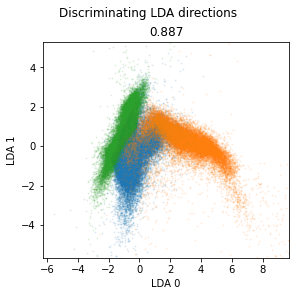

In [77]:
import dabl

dabl.plot(df, 'class')

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (100000, 18)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  10
    Number of Integer-Categorical Columns =  6
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Colu

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
3582,1.237680e+18,13.161838,20.329558,23.96359,24.41554,21.92542,20.89438,19.96155,7923,301,5,264,8.578456e+18,GALAXY,0.762486,7619,56900,817
60498,1.237662e+18,200.572696,38.674799,21.25550,21.08849,20.97834,20.77301,20.56856,3900,301,3,456,9.958701e+18,QSO,0.766414,8845,58159,423
53227,1.237661e+18,115.257132,19.503271,23.27590,23.05990,21.89798,21.26267,21.73729,3605,301,4,33,1.008255e+19,GALAXY,0.673666,8955,57451,405
21333,1.237679e+18,36.043670,1.002345,22.03466,21.07686,19.31867,18.60666,18.23209,7717,301,1,570,7.927595e+17,GALAXY,0.366534,704,52205,458
3885,1.237664e+18,5.225188,-1.173447,21.22157,19.41812,18.02884,17.51454,17.16425,4263,301,1,150,4.750238e+18,GALAXY,0.208840,4219,55480,242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21243,1.237668e+18,178.659485,22.213454,23.02713,21.79717,20.15561,19.21565,18.74604,5183,301,3,310,7.231673e+18,GALAXY,0.479940,6423,56313,63
45891,1.237666e+18,231.520274,18.764341,20.39821,18.49582,17.39976,16.88339,16.45156,4670,301,1,226,2.430822e+18,GALAXY,0.108567,2159,54328,13
42613,1.237663e+18,334.856082,0.077762,18.97330,17.87081,17.44646,17.29562,17.20019,4192,301,4,188,1.288148e+18,STAR,-0.000550,1144,53238,432
43567,1.237651e+18,200.820199,65.272106,19.70816,18.40767,17.58343,17.22796,17.01092,1302,301,6,420,6.790177e+17,GALAXY,0.165433,603,52056,364


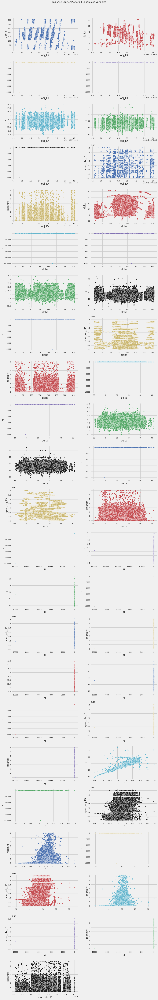

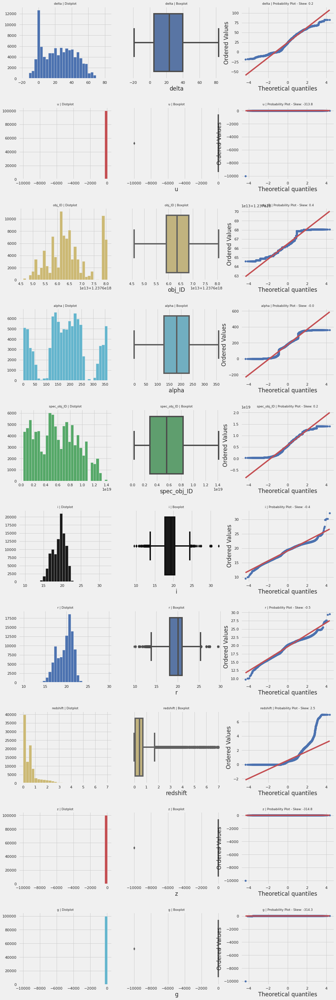

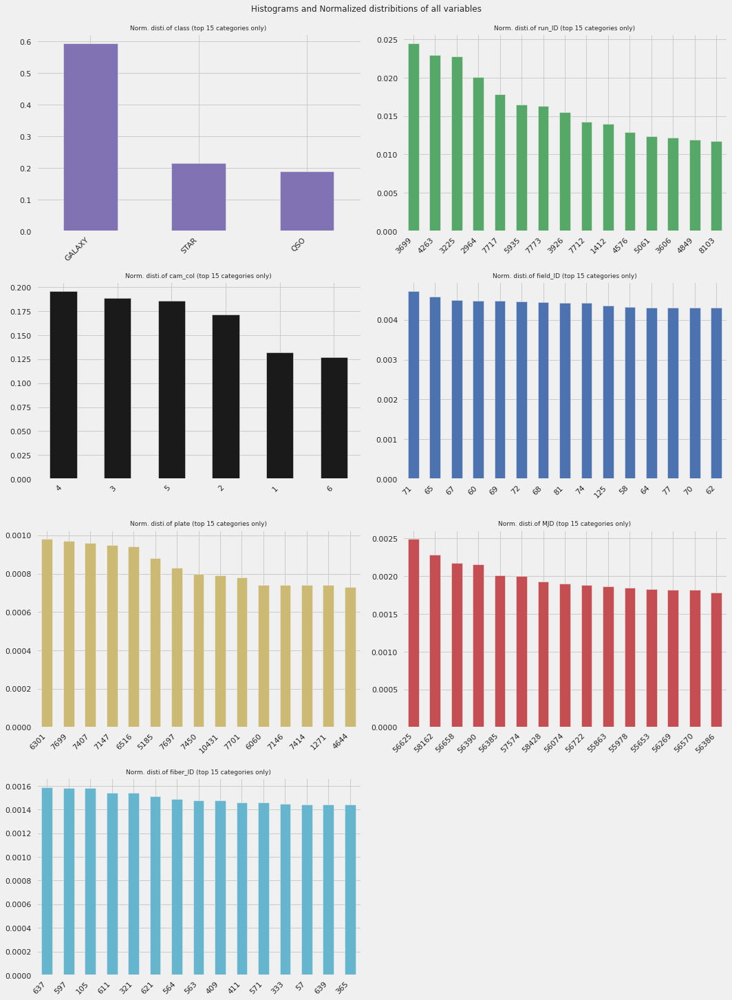

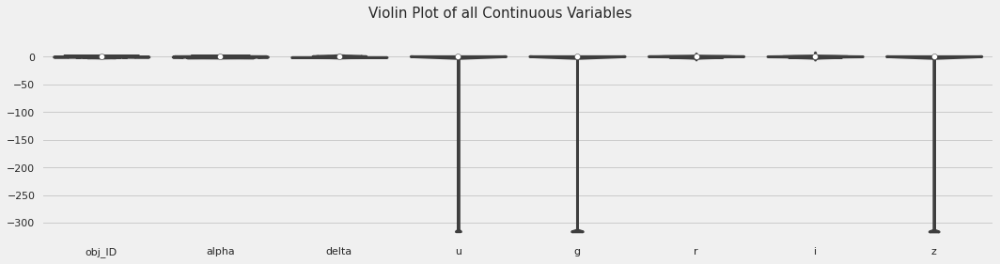

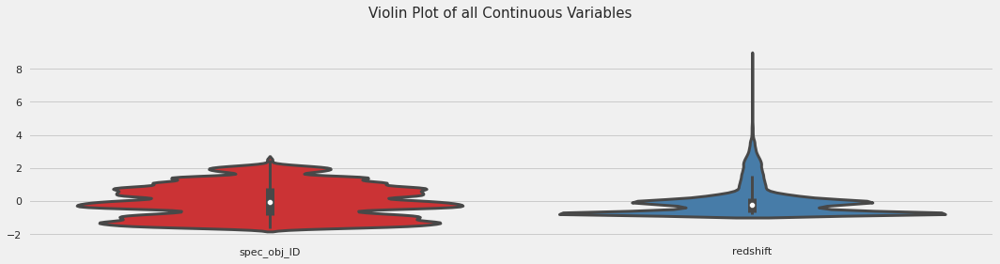

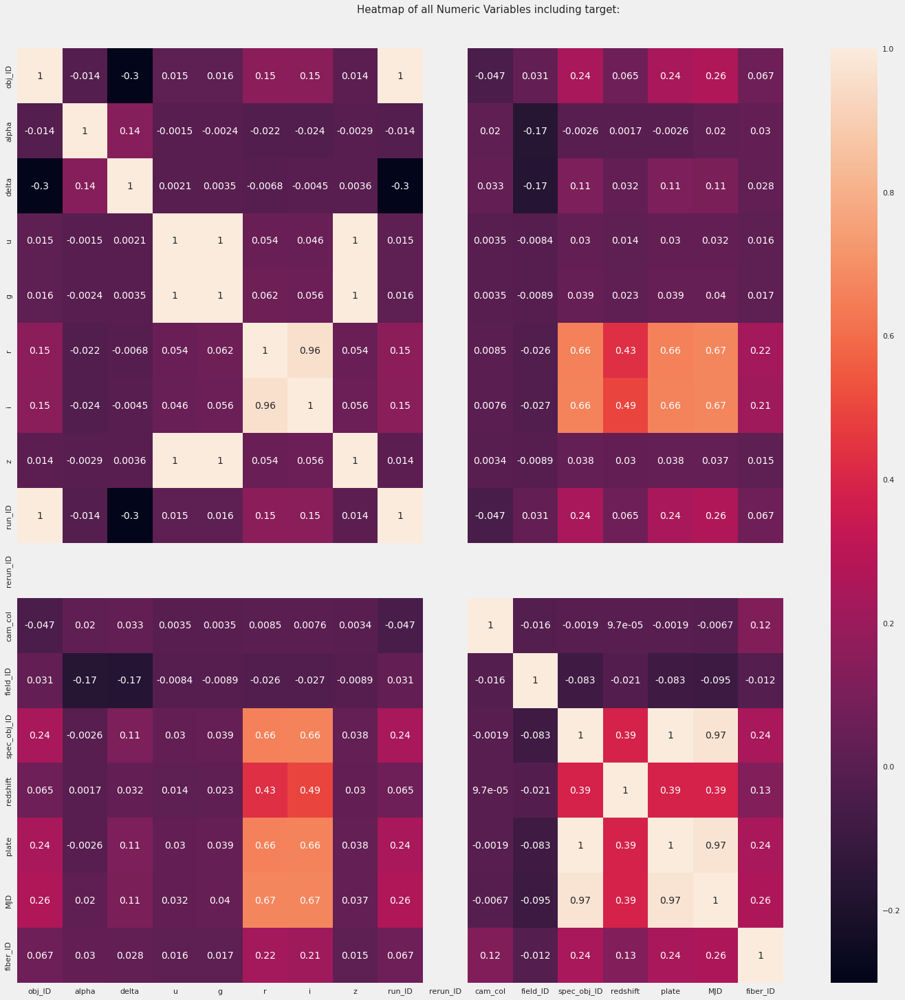

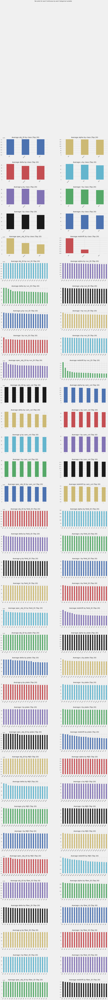

In [78]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
AV.AutoViz('../input/stellar-classification-dataset-sdss17/star_classification.csv', sep=',', depVar='', dfte=df, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=100000,max_cols_analyzed=20)

In [79]:
#checking for missing values
df.isnull().sum()
#no missing values, that's a relief

alpha          0
delta          0
u              0
g              0
r              0
i              0
z              0
field_ID       0
spec_obj_ID    0
class          0
redshift       0
plate          0
MJD            0
fiber_ID       0
dtype: int64

In [80]:
#we will use this processed data for different machine learning algorithms
processed_data=df.copy()
processed_data.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


# Unsupervised Learning Approch - I
We will use K-Means Clustering for **all** the remaining data attributes.

# 1. Loading the data

In [81]:
#we will use the copy of the saved data since we don't want to make any changes in it
df=processed_data.copy()
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


# 2. Modeling - I

In [82]:
#importing the function
from sklearn.cluster import KMeans 

#assinging the number of clusters
km=KMeans(n_clusters=3)

#fitting the model
#we are using all the columns in here
y_predicted=km.fit_predict(df[['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'field_ID', 'spec_obj_ID',
                               'redshift', 'plate', 'MJD', 'fiber_ID']])

#appending the predictions to original dataset
df['cluster']=y_predicted
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,cluster
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,79,6.543777e+18,GALAXY,0.634794,5812,56354,171,1
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,119,1.176014e+19,GALAXY,0.779136,10445,58158,427,2
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,120,5.152200e+18,GALAXY,0.644195,4576,55592,299,1
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,214,1.030107e+19,GALAXY,0.932346,9149,58039,775,2
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,137,6.891865e+18,GALAXY,0.116123,6121,56187,842,1


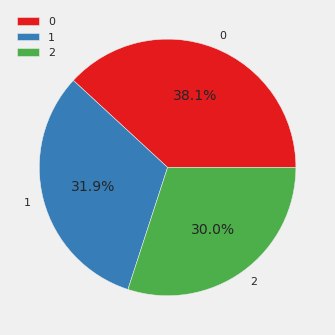

In [83]:
#proportion of different elements of the predicted cluster column
plt.pie(df['cluster'].value_counts(),autopct="%1.1f%%",labels=['0','1','2'])
plt.legend()

# 3. Checking the Accuracy with Visualization - I
We cannot directly check the accuracy of the model that uses unsupervised learning, since the labels aren't available to us as they do in supervised learning. But, in this particular dataset the labels are given,though, I'm not using them for training model like we do in superivsed learning, I can still use them to visualize the accuracy while comparing the clusters made by the unsupervised algorithm with the actual labels.

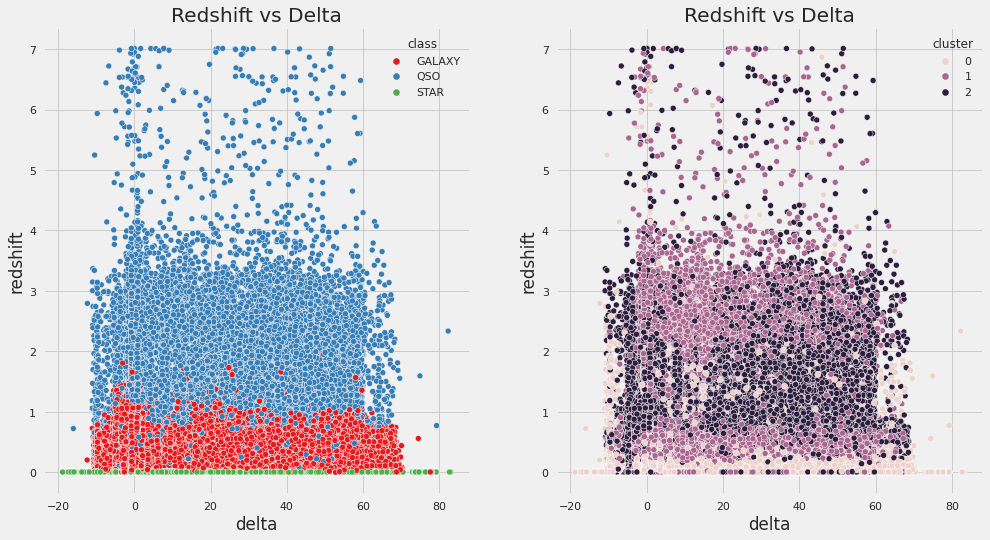

In [84]:
fig, axes = plt.subplots(1,2, figsize=(15, 8))
axes[0].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='class', ax=axes[0])

axes[1].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='cluster', ax=axes[1]);

You can see from the plot that the clusters aren't made properly, means that the model isn't working properly.

# 4. Scaling
We will try to scale down the data using `MinMaxScaler()`. Scaling brings the data points in the range of 0 to 1.

In [85]:
df=processed_data.copy()
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
for i in ['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'field_ID', 'spec_obj_ID',
                               'redshift', 'plate', 'MJD', 'fiber_ID']:
    df[i]=scaler.fit_transform(df[[i]])

In [86]:
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,0.376905,0.503802,0.591347,0.558050,0.535344,0.427665,0.464377,0.069530,0.451585,GALAXY,0.091831,0.451592,0.648007,0.170170
1,0.402286,0.491812,0.632603,0.584423,0.646203,0.515986,0.607035,0.110429,0.828833,GALAXY,0.112389,0.828841,0.894320,0.426426
2,0.394960,0.534139,0.654888,0.576463,0.546218,0.435729,0.472194,0.111452,0.350946,GALAXY,0.093170,0.350949,0.543965,0.298298
3,0.940947,0.180600,0.511384,0.629186,0.596946,0.486717,0.487460,0.207566,0.723313,GALAXY,0.134210,0.723312,0.878072,0.774775
4,0.959118,0.392679,0.387463,0.335579,0.337999,0.287021,0.300043,0.128834,0.476759,GALAXY,0.017959,0.476753,0.625205,0.841842


# 5. Modeling - II

In [87]:
km=KMeans(n_clusters=3)
y_predicted=km.fit_predict(df[['alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'field_ID', 'spec_obj_ID',
                               'redshift', 'plate', 'MJD', 'fiber_ID']])
df['cluster_second']=y_predicted
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,cluster_second
0,0.376905,0.503802,0.591347,0.558050,0.535344,0.427665,0.464377,0.069530,0.451585,GALAXY,0.091831,0.451592,0.648007,0.170170,1
1,0.402286,0.491812,0.632603,0.584423,0.646203,0.515986,0.607035,0.110429,0.828833,GALAXY,0.112389,0.828841,0.894320,0.426426,1
2,0.394960,0.534139,0.654888,0.576463,0.546218,0.435729,0.472194,0.111452,0.350946,GALAXY,0.093170,0.350949,0.543965,0.298298,1
3,0.940947,0.180600,0.511384,0.629186,0.596946,0.486717,0.487460,0.207566,0.723313,GALAXY,0.134210,0.723312,0.878072,0.774775,0
4,0.959118,0.392679,0.387463,0.335579,0.337999,0.287021,0.300043,0.128834,0.476759,GALAXY,0.017959,0.476753,0.625205,0.841842,0


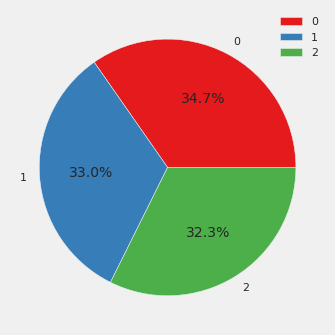

In [88]:
#proportion of different elements of the predicted cluster column
plt.pie(df['cluster_second'].value_counts(),autopct="%1.1f%%",labels=['0','1','2'])
plt.legend()

# 6. Checking the Accuracy with Visualization - II

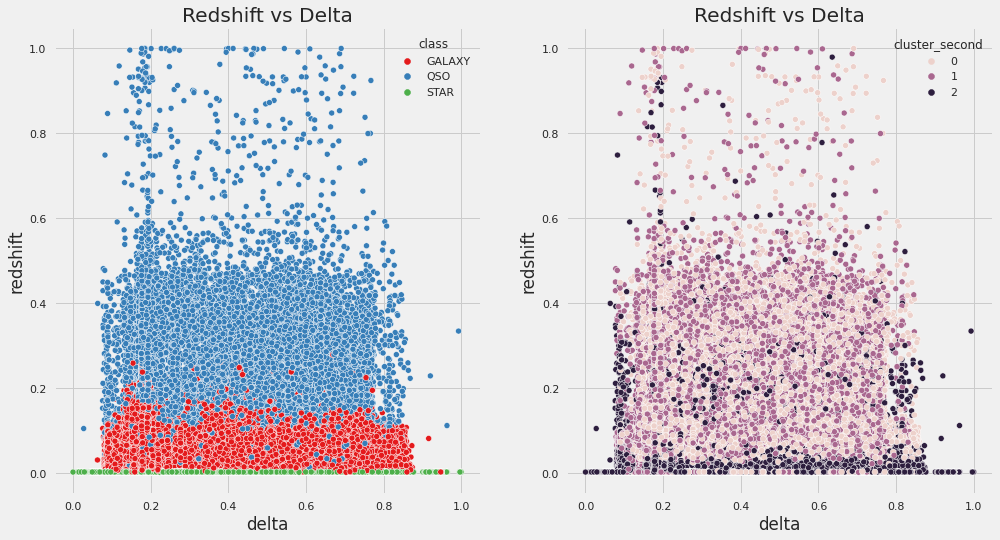

In [89]:
fig, axes = plt.subplots(1,2, figsize=(15, 8))
axes[0].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='class', ax=axes[0])

axes[1].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='cluster_second', ax=axes[1]);

Even though we have used scaling the clusters aren't clearly distinguishable as they are in the first plot.

# Unsupervised Learning Approch - II
We will use only those columns whose data is normally distributed with respect to the redshift. It includes '`u', 'g', 'r', 'i', 'z',` and off course the `'redshift'`.

# 1. Loading the Data

In [90]:
df=processed_data.copy()
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


# 2. Scaling

In [91]:
#scaling the relevent columns
scaler=MinMaxScaler()
for i in ['u', 'g', 'r', 'i', 'z','redshift']:
    df[i]=scaler.fit_transform(df[[i]])

# 3. Modeling

In [92]:
km=KMeans(n_clusters=3)
y_predicted=km.fit_predict(df[['u', 'g', 'r', 'i', 'z','redshift']])
df['cluster']=y_predicted
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,cluster
0,135.689107,32.494632,0.591347,0.558050,0.535344,0.427665,0.464377,79,6.543777e+18,GALAXY,0.091831,5812,56354,171,0
1,144.826101,31.274185,0.632603,0.584423,0.646203,0.515986,0.607035,119,1.176014e+19,GALAXY,0.112389,10445,58158,427,0
2,142.188790,35.582444,0.654888,0.576463,0.546218,0.435729,0.472194,120,5.152200e+18,GALAXY,0.093170,4576,55592,299,0
3,338.741038,-0.402828,0.511384,0.629186,0.596946,0.486717,0.487460,214,1.030107e+19,GALAXY,0.134210,9149,58039,775,0
4,345.282593,21.183866,0.387463,0.335579,0.337999,0.287021,0.300043,137,6.891865e+18,GALAXY,0.017959,6121,56187,842,1


# 4. Checking the Accuracy

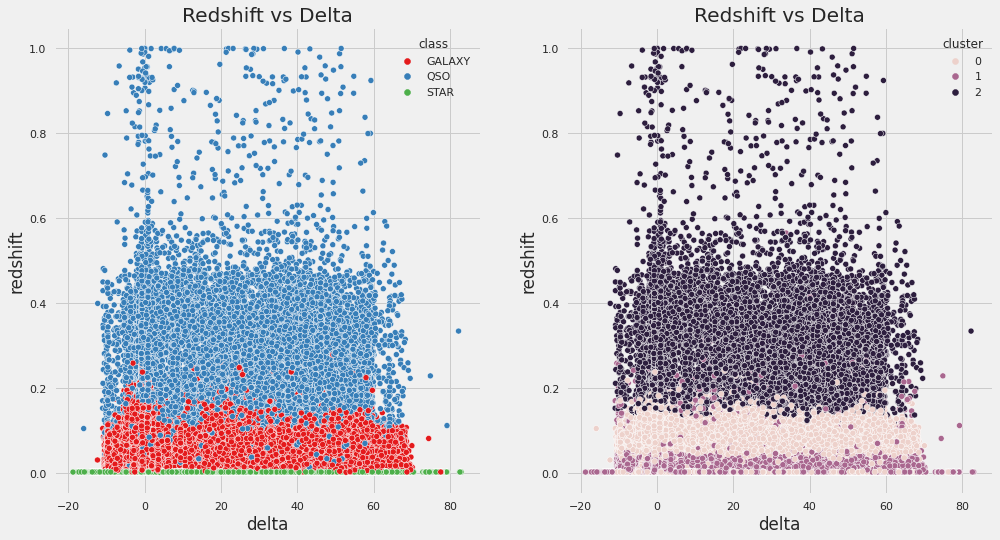

In [93]:
#with help of visualization
fig, axes = plt.subplots(1,2, figsize=(15, 8))
axes[0].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='class', ax=axes[0])

axes[1].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='cluster', ax=axes[1]);

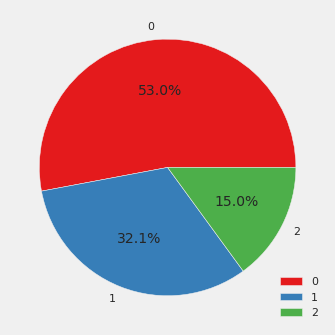

In [94]:
#proportion of different elements of the predicted cluster column
plt.pie(df['cluster'].value_counts(),autopct="%1.1f%%",labels=['0','1','2'])
plt.legend()

In [95]:
#with the help of 'class' and 'cluster'
#labeling
df1 = df.copy()
df1['class'].replace({'GALAXY':1,'STAR':2,'QSO':0},inplace=True)

#getting the accuracy
from sklearn.metrics import accuracy_score
print('The accuracy is :',accuracy_score(df1['class'], df1['cluster']))

The accuracy is : 0.22324223242232422


In [96]:
df1

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,cluster
0,135.689107,32.494632,0.591347,0.558050,0.535344,0.427665,0.464377,79,6.543777e+18,1,0.091831,5812,56354,171,0
1,144.826101,31.274185,0.632603,0.584423,0.646203,0.515986,0.607035,119,1.176014e+19,1,0.112389,10445,58158,427,0
2,142.188790,35.582444,0.654888,0.576463,0.546218,0.435729,0.472194,120,5.152200e+18,1,0.093170,4576,55592,299,0
3,338.741038,-0.402828,0.511384,0.629186,0.596946,0.486717,0.487460,214,1.030107e+19,1,0.134210,9149,58039,775,0
4,345.282593,21.183866,0.387463,0.335579,0.337999,0.287021,0.300043,137,6.891865e+18,1,0.017959,6121,56187,842,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,39.620709,-2.594074,0.512797,0.591245,0.611752,0.522045,0.562598,581,1.055431e+19,1,0.001420,9374,57749,438,0
99996,29.493819,19.798874,0.536831,0.563308,0.538130,0.453770,0.495813,289,8.586351e+18,1,0.059087,7626,56934,866,0
99997,224.587407,15.700707,0.466966,0.415644,0.424420,0.362588,0.391468,308,3.112008e+18,1,0.021839,2764,54535,74,1
99998,212.268621,46.660365,0.658896,0.527831,0.510982,0.423554,0.455834,131,7.601080e+18,1,0.066229,6751,56368,470,0


This accuracy much significant given the fact that we are using unsupervised learnig algorithm.

In [97]:
for i in ['alpha', 'delta']:
    df[i]=scaler.fit_transform(df[[i]])

In [98]:
km=KMeans(n_clusters=3)
y_predicted=km.fit_predict(df[['u', 'g', 'r', 'i', 'z','redshift']])
df['cluster']=y_predicted
df.head()

,alpha,delta,u,g,r,i,z,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID,cluster
0,0.376905,0.503802,0.591347,0.558050,0.535344,0.427665,0.464377,79,6.543777e+18,GALAXY,0.091831,5812,56354,171,1
1,0.402286,0.491812,0.632603,0.584423,0.646203,0.515986,0.607035,119,1.176014e+19,GALAXY,0.112389,10445,58158,427,1
2,0.394960,0.534139,0.654888,0.576463,0.546218,0.435729,0.472194,120,5.152200e+18,GALAXY,0.093170,4576,55592,299,1
3,0.940947,0.180600,0.511384,0.629186,0.596946,0.486717,0.487460,214,1.030107e+19,GALAXY,0.134210,9149,58039,775,1
4,0.959118,0.392679,0.387463,0.335579,0.337999,0.287021,0.300043,137,6.891865e+18,GALAXY,0.017959,6121,56187,842,0


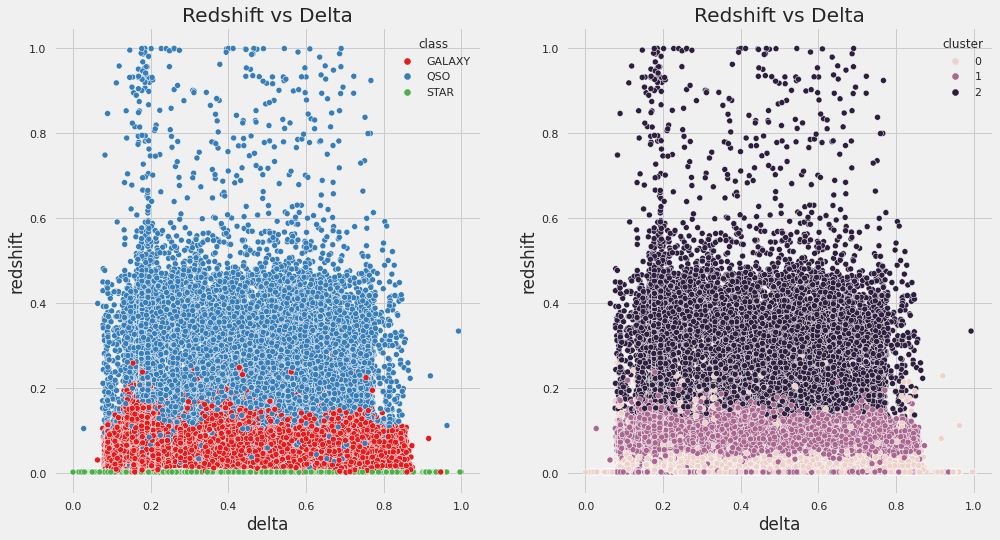

In [99]:
#with help of visualization
fig, axes = plt.subplots(1,2, figsize=(15, 8))
axes[0].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='class', ax=axes[0])

axes[1].set_title('Redshift vs Delta')
sns.scatterplot(data=df,x='delta', y='redshift', hue='cluster', ax=axes[1]);

In [100]:
#with the help of 'class' and 'cluster'
#labeling
df1 = df.copy()
df1['class'].replace({'GALAXY':0,'STAR':2,'QSO':1},inplace=True)

#getting the accuracy
from sklearn.metrics import accuracy_score
print('The accuracy is :',accuracy_score(df1['class'], df1['cluster']))

The accuracy is : 0.22362223622236221


# SUPERVISED LEARNING MODELS

In [101]:
df_new = pd.read_csv("/kaggle/input/stellar-classification-dataset-sdss17/star_classification.csv")
df_new

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,GALAXY,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,GALAXY,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,GALAXY,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,GALAXY,0.455040,6751,56368,470


In [102]:
df_new['class'] = LabelEncoder().fit_transform(df_new['class'])

In [103]:
df_new

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,0,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,0,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,0,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,0,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,0,0.116123,6121,56187,842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,1.237679e+18,39.620709,-2.594074,22.16759,22.97586,21.90404,21.30548,20.73569,7778,301,2,581,1.055431e+19,0,0.000000,9374,57749,438
99996,1.237679e+18,29.493819,19.798874,22.69118,22.38628,20.45003,19.75759,19.41526,7917,301,1,289,8.586351e+18,0,0.404895,7626,56934,866
99997,1.237668e+18,224.587407,15.700707,21.16916,19.26997,18.20428,17.69034,17.35221,5314,301,4,308,3.112008e+18,0,0.143366,2764,54535,74
99998,1.237661e+18,212.268621,46.660365,25.35039,21.63757,19.91386,19.07254,18.62482,3650,301,4,131,7.601080e+18,0,0.455040,6751,56368,470


In [104]:
df_new=df_new[df_new.z>-2000]
df_new=df_new[df_new.u>-2000]
df_new=df_new[df_new.g>-2000]

In [105]:
x = df_new[['u', 'g', 'r', 'i', 'z', 'redshift', 'plate']].copy()
x

,u,g,r,i,z,redshift,plate
0,23.87882,22.27530,20.39501,19.16573,18.79371,0.634794,5812
1,24.77759,22.83188,22.58444,21.16812,21.61427,0.779136,10445
2,25.26307,22.66389,20.60976,19.34857,18.94827,0.644195,4576
3,22.13682,23.77656,21.61162,20.50454,19.25010,0.932346,9149
4,19.43718,17.58028,16.49747,15.97711,15.54461,0.116123,6121
...,...,...,...,...,...,...,...
99995,22.16759,22.97586,21.90404,21.30548,20.73569,0.000000,9374
99996,22.69118,22.38628,20.45003,19.75759,19.41526,0.404895,7626
99997,21.16916,19.26997,18.20428,17.69034,17.35221,0.143366,2764
99998,25.35039,21.63757,19.91386,19.07254,18.62482,0.455040,6751


In [106]:
x

,u,g,r,i,z,redshift,plate
0,23.87882,22.27530,20.39501,19.16573,18.79371,0.634794,5812
1,24.77759,22.83188,22.58444,21.16812,21.61427,0.779136,10445
2,25.26307,22.66389,20.60976,19.34857,18.94827,0.644195,4576
3,22.13682,23.77656,21.61162,20.50454,19.25010,0.932346,9149
4,19.43718,17.58028,16.49747,15.97711,15.54461,0.116123,6121
...,...,...,...,...,...,...,...
99995,22.16759,22.97586,21.90404,21.30548,20.73569,0.000000,9374
99996,22.69118,22.38628,20.45003,19.75759,19.41526,0.404895,7626
99997,21.16916,19.26997,18.20428,17.69034,17.35221,0.143366,2764
99998,25.35039,21.63757,19.91386,19.07254,18.62482,0.455040,6751


In [107]:
y = df_new['class']
y

0        0
1        0
2        0
3        0
4        0
        ..
99995    0
99996    0
99997    0
99998    0
99999    0
Name: class, Length: 99999, dtype: int64

**Sampling using SMOTE**

In [108]:
sm = SMOTE(random_state = 30, k_neighbors = 5)
x_resampled, y_resampled = sm.fit_resample(x, y)

In [127]:
X_train, X_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=0.05, random_state = 30)

In [110]:
dt=DecisionTreeClassifier(criterion='entropy',random_state=2,max_depth=10)
dt.fit(X_train,y_train)
y_pred3=dt.predict(X_test)
y_pred3

array([0, 2, 2, ..., 2, 0, 1])

In [111]:
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.96      0.97      0.97      2960
           1       0.97      0.96      0.97      2987
           2       1.00      1.00      1.00      2970

    accuracy                           0.98      8917
   macro avg       0.98      0.98      0.98      8917
weighted avg       0.98      0.98      0.98      8917



In [112]:
joblib.dump(dt, '/kaggle/working/DTStellarClass98.pkl')

['/kaggle/working/DTStellarClass98.pkl']

In [113]:
!pip list

Package                               Version                Editable project location
------------------------------------- ---------------------- -------------------------
absl-py                               0.15.0
accelerate                            0.12.0
access                                1.1.8
affine                                2.3.1
aiobotocore                           2.4.0
aiohttp                               3.8.1
aioitertools                          0.11.0
aiosignal                             1.2.0
albumentations                        1.3.0
alembic                               1.8.1
allennlp                              2.10.1
altair                                4.2.0
annoy                                 1.17.1
ansiwrap                              0.8.4
anyio                                 3.6.1
apache-beam                           2.40.0
aplus                                 0.11.0
appdirs                               1.4.4
argon2-cffi                

In [114]:
arr = np.array([22.62171, 21.79745, 20.60115, 20.00959, 19.28075, 0.542944, 7410])
arr = arr.reshape(1, -1)

y_pred = dt.predict(arr)
y_pred

array([0])

In [116]:
df_newest = df_new[['u', 'g', 'r', 'i', 'z', 'redshift', 'plate', 'class']].copy()
df_newest

,u,g,r,i,z,redshift,plate,class
0,23.87882,22.27530,20.39501,19.16573,18.79371,0.634794,5812,0
1,24.77759,22.83188,22.58444,21.16812,21.61427,0.779136,10445,0
2,25.26307,22.66389,20.60976,19.34857,18.94827,0.644195,4576,0
3,22.13682,23.77656,21.61162,20.50454,19.25010,0.932346,9149,0
4,19.43718,17.58028,16.49747,15.97711,15.54461,0.116123,6121,0
...,...,...,...,...,...,...,...,...
99995,22.16759,22.97586,21.90404,21.30548,20.73569,0.000000,9374,0
99996,22.69118,22.38628,20.45003,19.75759,19.41526,0.404895,7626,0
99997,21.16916,19.26997,18.20428,17.69034,17.35221,0.143366,2764,0
99998,25.35039,21.63757,19.91386,19.07254,18.62482,0.455040,6751,0


In [117]:
df_newest.to_csv("/kaggle/working/finalsdssdataset.csv")

In [128]:
x_train = X_train.drop(['plate'], axis=1)
x_train

,u,g,r,i,z,redshift
8430,19.502150,19.226380,19.068080,19.094470,18.992710,0.821969
121762,20.363485,20.248557,20.207240,20.069278,19.847847,1.497744
147027,23.085762,21.869238,21.671401,21.378638,21.401447,-0.000783
156087,24.365643,21.880047,21.553408,21.025884,20.742826,-0.000319
30817,24.634680,21.514420,21.128360,20.300610,20.395220,0.000042
...,...,...,...,...,...,...
66455,23.502900,22.232600,20.676510,19.837060,19.494010,0.509712
46220,20.520860,19.075940,18.505900,18.324570,18.224020,-0.000399
98804,18.697770,17.239950,16.334020,15.799650,15.529150,0.083069
48045,23.205730,20.759280,19.114160,18.408830,18.012900,0.264555


In [129]:
x_test = X_test.drop(['plate'], axis=1)
x_test

,u,g,r,i,z,redshift
63008,23.869170,22.486700,20.948470,19.931550,19.365720,0.540425
144805,23.007962,21.159096,19.896260,19.273475,18.857827,-0.000138
161222,23.082409,20.893648,20.569680,20.333111,20.067378,-0.000473
42827,19.895570,19.883410,19.894540,19.605810,19.475850,1.751415
36915,21.567180,21.225320,20.893690,20.774970,20.346370,1.167693
...,...,...,...,...,...,...
23567,23.626150,26.052730,22.208180,21.115110,19.824500,0.844843
156858,20.612178,19.790503,19.308080,19.228805,19.079526,-0.000720
177363,19.856902,18.581332,18.083241,17.897579,17.813246,-0.000054
92308,26.063060,22.714260,20.853770,19.884370,19.362310,0.598962


In [130]:
dt2=DecisionTreeClassifier(criterion='entropy',random_state=2,max_depth=10)
dt2.fit(x_train,y_train)
y_pred3=dt2.predict(x_test)
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      2960
           1       0.97      0.96      0.97      2987
           2       1.00      1.00      1.00      2970

    accuracy                           0.98      8917
   macro avg       0.98      0.98      0.98      8917
weighted avg       0.98      0.98      0.98      8917

